#Dog breed identification
The dataset comprises 120 breeds of dogs. The goal of the competition is to create a classifier capable of determining a dog's breed from a photo.
## data:
***train.zip*** - the training set, you are provided the breed for these dogs

***test.zip*** - the test set, you must predict the probability of each breed for each image
sample_submission.csv - a sample submission file in the correct format

***labels.csv*** - the breeds for the images in the train set

source of data: https://www.kaggle.com/competitions/dog-breed-identification/data

In [3]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
!unzip "drive/MyDrive/dog_breed/dog-breed-identification.zip" -d "drive/MyDrive/dog_breed"

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
  inflating: drive/MyDrive/dog_breed/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/dog_breed/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/dog_breed/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/dog_breed/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/dog_breed/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/dog_breed/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/dog_breed/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/dog_breed/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/dog_breed/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/dog_breed/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/dog_breed/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/dog_br

In [ ]:
!file "/content/drive/MyDrive/dog_breed/dog-breed-identification.zip"

/content/drive/MyDrive/dog_breed/dog-breed-identification.zip: Zip archive data, at least v4.5 to extract, compression method=deflate


In [ ]:
print("GPU available") if tf.config.list_physical_devices else print("Nope")

GPU available


##Turning images into Tensor (numerical representations)

In [4]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/dog_breed/labels.csv")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

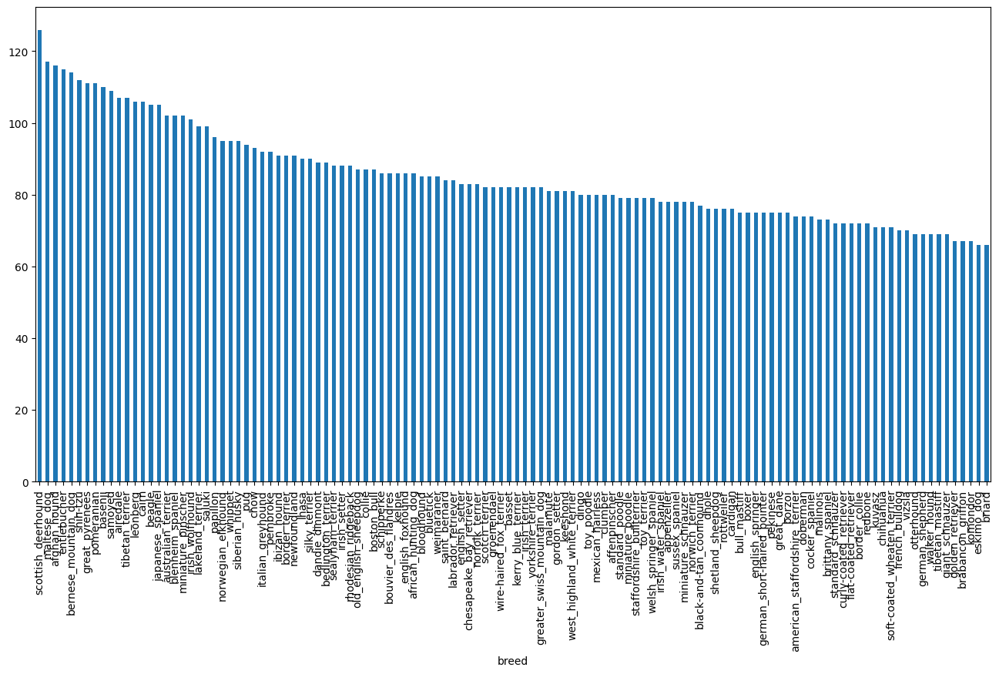

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize = (16, 8))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

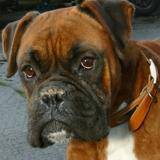

In [5]:
from IPython.display import Image
Image("/content/drive/MyDrive/dog_breed/train/008887054b18ba3c7601792b6a453cc3.jpg")

### Getting images and their labels





In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
filenames =["drive/MyDrive/dog_breed/train/" + fname +".jpg" for fname in labels_csv["id"]]
#filenames

In [7]:
#Checking whwther number of filenames matches number of actual image files

import os
if len(os.listdir("drive/MyDrive/dog_breed/train/")) == len(filenames):
  print ("Filenames match actual amount of files")
else: print ("Filenames do not match actual amount of files")

Filenames match actual amount of files


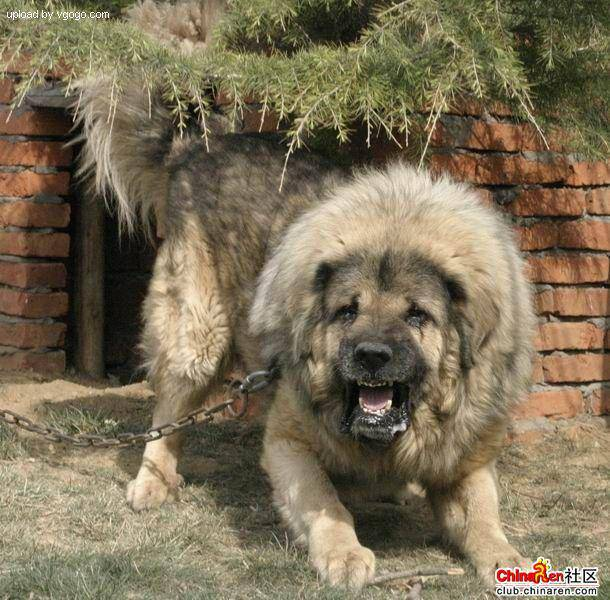

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [8]:
import numpy as np

In [9]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len (labels) == len(filenames):
  print ("Number of labels matches number of filenames")
else:
  print("do not match")

Number of labels matches number of filenames


In [10]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [11]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Validation set

In [12]:
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

### I am going to startf off experimenting with ~1000 images and increase as needed

In [13]:
# Setting number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:100}

In [14]:
# Splitting data into train and validation sets

from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/dog_breed/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog_breed/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog_breed/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog_breed/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog_breed/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## Preprocessing images (turning images into Tensors)

In [15]:
from matplotlib.pyplot import imread
IMG_SIZE = 224

def preprocessingImage (image_path):
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turning the jpeg image into numerical Tensor with 3 colour channels RGB
  image = tf.image.decode_jpeg(image, channels=3)
  #Converting the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #resizing image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches
To not trying process 10,000+ images in one go, so it's better to do 32 (batch size) images at a time



In [16]:
def get_image_label(image_path, label):
  image = preprocessingImage(image_path)
  return image, label

In [17]:
BATCH_SIZE = 32

def create_data_batches(X, y= None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches od data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuddle if it's validation data.
  Also accepts test data as input (no labels)
  """

  # If the data is a test dataset, we don't have labels
  if test_data:
    print("creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch = data.map(preprocessingImage).batch(BATCH_SIZE)
    return data_batch

  #If the data is a valid dataset, there is no need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    #Shuffling pathnames and labels before mapping image processor function is faster than shuffeling images after
    data = data.shuffle(buffer_size=len(X))

    #Create (image, label) tuples and preprocess image
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [18]:
#creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)


Creating training data batches...
Creating validation data batches...


In [19]:
#Checking out data batches' attributes
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
## Visualizing data batches
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range (25):
    #subplots (5 rows and 5 cows)
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")
  plt.show()

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [17]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.55261117e-01, 2.57221907e-01, 1.70947373e-01],
          [3.53667736e-01, 2.55628526e-01, 1.69353992e-01],
          [3.82974505e-01, 2.81013697e-01, 1.90817595e-01],
          ...,
          [1.27881095e-01, 1.16116390e-01, 9.65085477e-02],
          [1.26811981e-01, 1.15047276e-01, 9.54394341e-02],
          [1.26811981e-01, 1.15047276e-01, 9.54394341e-02]],
 
         [[3.60871851e-01, 2.62832642e-01, 1.76558122e-01],
          [3.64241958e-01, 2.66202748e-01, 1.79928228e-01],
          [3.93541694e-01, 2.91580886e-01, 2.01384798e-01],
          ...,
          [1.18237033e-01, 1.06472328e-01, 8.68644863e-02],
          [1.13681734e-01, 1.01917028e-01, 8.23091790e-02],
          [1.13681734e-01, 1.01917028e-01, 8.23091790e-02]],
 
         [[3.74002129e-01, 2.75962889e-01, 1.89688385e-01],
          [3.83937359e-01, 2.85898119e-01, 1.99623615e-01],
          [4.10142452e-01, 3.08181643e-01, 2.17985585e-01],
          ...,
          [1.17358156e-01, 1.05593450e-01, 8.5985

In [ ]:
len(train_images), len(train_labels)

(32, 32)

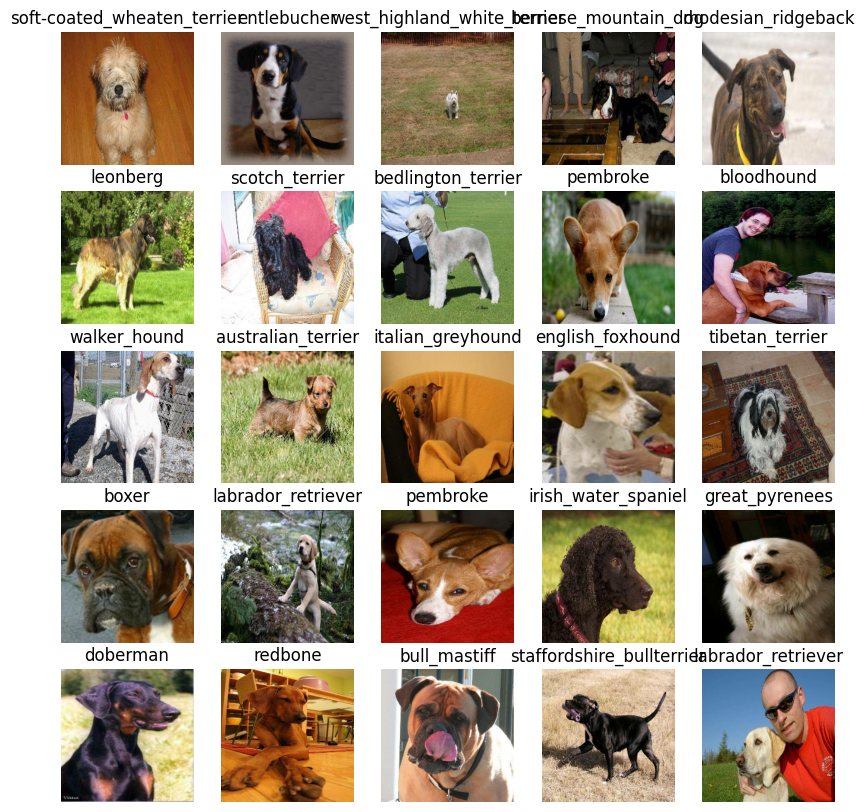

In [ ]:
show_25_images(images=train_images , labels=train_labels)

In [ ]:
print(type(plt.figure))

<class 'tuple'>


In [20]:
val_images, val_labels = next(train_data.as_numpy_iterator())
#show_25_images(train_images, train_labels)

## Building a model
* The input shape (our images shape, int the form of Tensors) to model
* The output shape (image labels, in the form of tensors) of our model
* The URL of the model we want to use


In [ ]:
import kagglehub

In [21]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels
#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)
#Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1"
#path = kagglehub.model_download("google/mobilenet-v2/tensorFlow2/035-128-classification")

In [ ]:
print("Path to model files:", path)

Path to model files: /root/.cache/kagglehub/models/google/mobilenet-v2/tensorFlow2/035-128-classification/2


### Keras deep learning model
Function:
* takes the input shape, output shape and the model we've choses as parameters
* Definies the layers in a Keras model in a swquential fashion
* Compiles the model
* Build the model
* Return the model



In [22]:
def create_model(imput_shape=INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with", MODEL_URL)

  model = tf.keras.Sequential([
        tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL)(x)),
        tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax")
        ])
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)

  return model

In [23]:
model =create_model()
model.summary()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating callbacks
helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving

Two callbacks: one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

To setup a TensorBoard callback, there are 3 things to do:
1. Load the TensorBoard norebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to out model's fit() function
3. Visualize our models training logs wit the %tensorboard magic function, after model training

In [24]:
# Load TensorBoard notebok extension
%load_ext tensorboard

In [25]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/dog_breed/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [24]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model (on subset of data)
First model will be working on 1000 images, to make sure everything is working

In [26]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [26]:
print("GPU", "available") if tf.config.list_physical_devices("GPU") else print ("no GPU")

GPU available


## function which trains a model
* Crete a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
cla the fit() function on our model passing it the training data, validation data, number of epochs to train for NUM_EPOCHS and the callback to use
* Return a model

In [27]:
def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  return model

In [28]:
model = train_model()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 207s 7s/step - accuracy: 0.0298 - loss: 5.3143 - val_accuracy: 0.2450 - val_loss: 3.3219
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 0.6274 - loss: 1.9161 - val_accuracy: 0.4950 - val_loss: 2.1522
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.9216 - loss: 0.6448 - val_accuracy: 0.5550 - val_loss: 1.6913
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - accuracy: 0.9851 - loss: 0.2671 - val_accuracy: 0.6350 - val_loss: 1.5206
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.9957 - loss: 0.1582 - val_accuracy: 0.6250 - val_loss: 1.4411
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - accuracy: 0.9954 - loss: 0.1066 - val_accuracy: 0.6350 - val_loss: 1.4004
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - accuracy: 1.0000 - loss: 0.0771 - val_accuracy: 0.6350 - val_loss

Checking the TensorBoard log

In [ ]:
%tensorboard --logdir drive/MyDrive/dog_breed/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [70]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step


array([[0.00039668, 0.0009227 , 0.00022399, ..., 0.00394462, 0.00034616,
        0.00542261],
       [0.00446275, 0.00097031, 0.00313993, ..., 0.01420359, 0.0090538 ,
        0.00319845],
       [0.00135021, 0.00245159, 0.00499071, ..., 0.00167883, 0.00415054,
        0.00243713],
       ...,
       [0.01201374, 0.00076096, 0.00284026, ..., 0.00098473, 0.00846336,
        0.0011524 ],
       [0.00185237, 0.00537362, 0.01523353, ..., 0.00463356, 0.00061048,
        0.00979382],
       [0.00065529, 0.00470851, 0.0017882 , ..., 0.00273018, 0.00133038,
        0.0047203 ]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
#fisrt prediction
index = 49
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted labe: {unique_breeds[np.argmax(predictions[index])]}")

[9.0259733e-03 1.0641759e-03 1.0521601e-02 5.6711462e-04 1.1040128e-01
 5.0512957e-04 8.2903873e-04 6.3682866e-04 3.6598549e-03 1.7573997e-02
 1.5338213e-03 5.5229601e-02 2.8127097e-04 9.8181644e-04 1.8866243e-03
 8.2056952e-04 1.2374419e-03 4.0958612e-03 5.8834847e-02 2.4435224e-03
 2.7391814e-02 2.0719857e-03 1.8502608e-03 3.2983017e-03 1.6973871e-03
 5.1738797e-03 1.8670084e-03 3.2429474e-03 5.5318739e-04 4.3078884e-03
 6.1646840e-03 1.5837910e-03 1.6585820e-04 1.0958319e-03 8.8433875e-04
 4.3576900e-03 1.8373209e-04 1.8714543e-03 3.3575271e-03 1.4298089e-03
 8.5979290e-03 2.4291154e-03 3.0471515e-03 1.8229950e-02 7.4532628e-02
 1.2422905e-04 3.5014354e-02 2.6061814e-03 1.1285640e-03 6.8433494e-03
 6.7778613e-04 8.8754337e-04 4.3671955e-03 6.1881477e-03 4.2211335e-02
 1.8651522e-04 7.1742566e-04 1.9348791e-02 5.1688426e-03 1.7633460e-03
 2.5792157e-03 1.3602290e-02 1.1700304e-04 1.0196422e-02 1.2040227e-03
 6.8339710e-03 4.0474543e-04 1.0960760e-03 1.9925108e-04 2.4309519e-03
 3.445

In [71]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'brittany_spaniel'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since validation data is still in a batch dataset, there is a need to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [31]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'labrador_retriever'

In [32]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

now there are ways to get:
* prediction labels
* validation labels (truth labels)
* validation images

Gonna create function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* convert the prediction probabilieties to a predicted label
plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [78]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  import matplotlib.pyplot as plt
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

In [79]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

IndexError: index 77 is out of bounds for axis 0 with size 32

In [ ]:
val_images[0].shape

(224, 224, 3)

## function to visualize models top predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the truth label green


In [35]:
def plot_pred_conf(prediction_probabilities, labels, n=1):

  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  #find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #find the top 10 prediction label
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color= "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
                       labels = top_10_pred_labels,
                       rotation = "vertical")

  #Change color of true labal
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


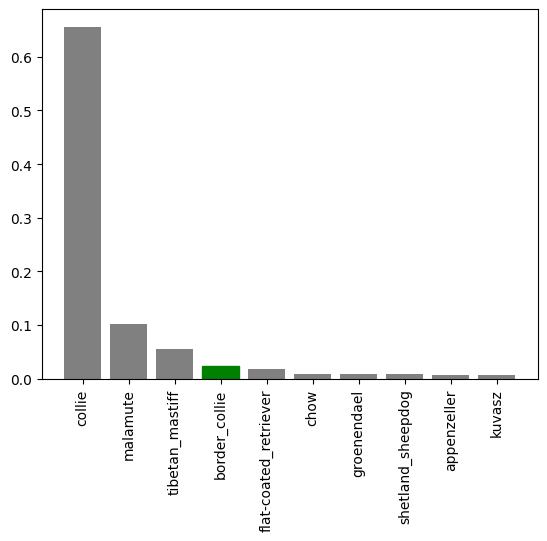

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [36]:
import matplotlib.pyplot as plt

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([  6,  17,  59,  35,  26,  65, 103,  70,  73,  79])

### Function to visualize predictions and evaluate model

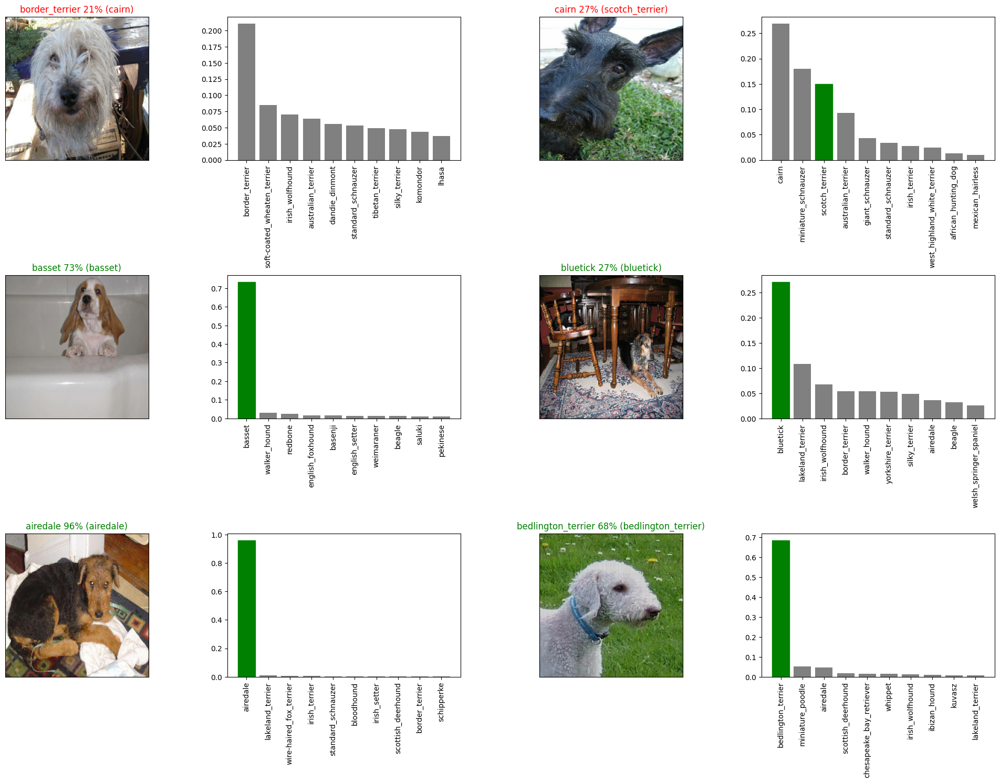

In [41]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
           labels = val_labels,
           images = val_images,
           n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [35]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  modeldir = os.path.join("drive/MyDrive/dog_breed/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-0" + suffix + ".keras" #format of model
  model.save(model_path)
  return model_path

In [39]:
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [64]:
save_model(model, suffix="100-images-mobilnetv2-Adam")

'drive/MyDrive/dog_breed/models/20250305-09011741165294-0100-images-mobilnetv2-Adam.keras'

In [70]:
from tensorflow import keras
keras.config.enable_unsafe_deserialization()
loaded_model = load_model("drive/MyDrive/dog_breed/models/20250305-09011741165294-0100-images-mobilnetv2-Adam.keras")

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [71]:
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - accuracy: 0.6274 - loss: 1.3145


[1.375131368637085, 0.6349999904632568]

In [75]:
loaded_model.evaluate(val_data)

NameError: Exception encountered when calling Lambda.call().

[1mname 'hub' is not defined[0m

Arguments received by Lambda.call():
  • inputs=tf.Tensor(shape=(None, 224, 224, 3), dtype=float32)
  • mask=None
  • training=False

## Training a model on the full data

In [28]:
len(X), len(y)

(10222, 10222)

In [29]:
#Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [30]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [31]:
full_model = create_model()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1


In [32]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data so we can't monitor validation accuract
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [33]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1438s 4s/step - accuracy: 0.4904 - loss: 2.3432
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 76s 123ms/step - accuracy: 0.8937 - loss: 0.3763
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - accuracy: 0.9441 - loss: 0.2187
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - accuracy: 0.9709 - loss: 0.1417
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - accuracy: 0.9828 - loss: 0.0979
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - accuracy: 0.9880 - loss: 0.0725
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - accuracy: 0.9917 - loss: 0.0548
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - accuracy: 0.9965 - loss: 0.0413
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 129ms/step - accuracy: 0.9977 - loss: 0.0312
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - accuracy: 0.9970 - loss: 0.0305
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - accuracy: 0.9975 - loss: 0.0262
Epoch 12/

In [37]:
save_model(full_model, suffix="full-data-set-mobilenetc2-Adam")

'drive/MyDrive/dog_breed/models/20250305-10311741170705-0full-data-set-mobilenetc2-Adam.keras'

In [42]:
from tensorflow import keras
keras.config.enable_unsafe_deserialization()
loaded_full_model = load_model("drive/MyDrive/dog_breed/models/20250305-10311741170705-0full-data-set-mobilenetc2-Adam.keras")

## Making predictions on the test dataset
* Get the test image filenames
* Convert the filenames into test data batches using create_data_batches and setting the test_data parameter to True (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the predict() method called on out model

In [43]:
test_path = "drive/MyDrive/dog_breed/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog_breed/test/d0919d222b2b96f23d8ee450bc66709b.jpg',
 'drive/MyDrive/dog_breed/test/d07b2effb520a43d34f08344a4158738.jpg',
 'drive/MyDrive/dog_breed/test/d073c9cffe0cf5d1d9d0862033289f16.jpg',
 'drive/MyDrive/dog_breed/test/d09d808f58c620b4b31a825331336dd8.jpg',
 'drive/MyDrive/dog_breed/test/d0c7a68925b01a72cb2c94e12faab906.jpg',
 'drive/MyDrive/dog_breed/test/d0c9462c2abd1aa3478c003be86c5ef0.jpg',
 'drive/MyDrive/dog_breed/test/d0ca12c4617619eb08ed0793b50d1ed9.jpg',
 'drive/MyDrive/dog_breed/test/d0cf17f20cb745d299cde350ba65dc63.jpg',
 'drive/MyDrive/dog_breed/test/d111da09291de948a9bda08dff4328f4.jpg',
 'drive/MyDrive/dog_breed/test/d11f6cf0d90e6e37a476c4fcfa76aa70.jpg']

In [44]:
len(test_filenames)

10357

In [45]:
test_data = create_data_batches(test_filenames, test_data = True)

creating test data batches


In [46]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [48]:
# Make predictions on test dat batch using the loaded full model
test_predictions = full_model.predict(test_data,
                                             verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 266s 804ms/step


In [52]:
np.savetxt("drive/MyDrive/dog_breed/preds_array.csv",test_predictions, delimiter=",")

In [53]:
test_predictions=np.loadtxt("drive/MyDrive/dog_breed/preds_array.csv", delimiter =",")

In [54]:
test_predictions[:10]

array([[1.23572846e-10, 9.85455273e-10, 6.05577047e-11, ...,
        2.61184541e-09, 4.35426318e-06, 1.37497613e-09],
       [9.84257675e-11, 2.30362435e-14, 1.09064125e-12, ...,
        2.36691326e-11, 9.99997139e-01, 6.45939702e-09],
       [2.23917246e-10, 3.69893526e-12, 1.22592644e-10, ...,
        4.11338519e-08, 3.46470642e-06, 2.10385376e-09],
       ...,
       [1.32480804e-09, 4.13516643e-09, 4.22942570e-10, ...,
        4.52762556e-08, 1.75558471e-05, 2.13662243e-09],
       [2.70907530e-14, 7.95653321e-08, 8.04442797e-12, ...,
        1.07142961e-09, 1.47302315e-09, 1.09497212e-11],
       [2.96220937e-09, 2.21085344e-13, 3.35166790e-11, ...,
        2.38232212e-10, 1.78148948e-05, 6.55403909e-08]])

In [55]:
test_predictions.shape

(10357, 120)

### Preparing dataset predictions for Kaggle
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle

In [57]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [60]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,d0919d222b2b96f23d8ee450bc66709b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,d07b2effb520a43d34f08344a4158738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,d073c9cffe0cf5d1d9d0862033289f16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,d09d808f58c620b4b31a825331336dd8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d0c7a68925b01a72cb2c94e12faab906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [61]:
## Ading the prediction probabilities
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,d0919d222b2b96f23d8ee450bc66709b,1.235728e-10,9.854553e-10,6.055770e-11,1.003235e-09,4.889704e-10,3.409301e-10,1.129434e-08,3.133180e-09,1.302908e-07,...,1.012243e-10,1.108689e-10,1.350209e-09,1.578811e-04,2.339419e-11,7.086359e-07,2.326795e-11,2.611845e-09,4.354263e-06,1.374976e-09
1,d07b2effb520a43d34f08344a4158738,9.842577e-11,2.303624e-14,1.090641e-12,7.014425e-07,4.658442e-13,1.247825e-11,1.617018e-08,1.394649e-11,2.320872e-15,...,4.442670e-12,9.399555e-08,3.220536e-10,2.365914e-09,9.438295e-14,1.943097e-11,1.936206e-09,2.366913e-11,9.999971e-01,6.459397e-09
2,d073c9cffe0cf5d1d9d0862033289f16,2.239172e-10,3.698935e-12,1.225926e-10,3.598940e-10,8.320906e-12,8.196940e-11,1.448296e-07,1.107104e-10,1.392471e-13,...,9.255408e-10,4.997554e-08,1.749866e-07,1.980080e-11,2.484133e-13,5.561305e-11,3.630009e-11,4.113385e-08,3.464706e-06,2.103854e-09
3,d09d808f58c620b4b31a825331336dd8,3.288564e-08,1.767350e-08,8.789086e-10,1.498625e-13,6.793095e-09,1.301012e-10,8.353663e-08,8.308863e-09,3.144728e-08,...,2.165707e-05,4.424046e-09,1.293443e-08,5.903452e-09,4.079791e-09,3.366108e-11,2.548735e-07,1.353240e-09,3.714572e-09,1.752534e-05
4,d0c7a68925b01a72cb2c94e12faab906,7.383800e-06,2.395745e-08,1.194535e-06,2.406155e-11,5.970394e-11,9.055370e-09,5.302426e-07,5.744126e-11,4.014750e-12,...,1.650036e-06,2.423644e-07,1.432270e-09,2.898257e-10,2.017139e-08,3.995208e-13,6.188553e-08,4.200413e-09,2.733468e-10,4.491404e-05


In [62]:
preds_df.to_csv("drive/MyDrive/dog_breed/full_model_predictions.csv",
                index=False)

## Making predictions on custom
* get the filepathsturn the filepath into data batches using create_data_batches(). Since there is no labels, set the test_data parameter to true
* pass the custom image data batch to our model's predict() method
* conver the predicion output probabilities to predictions labels
* compare the predicted labels to the custom images

In [63]:
custom_path= "drive/MyDrive/dog_breed/my_dog_photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [64]:
custom_image_paths

['drive/MyDrive/dog_breed/my_dog_photos/dog_photo.jpg']

In [65]:
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [66]:
custom_preds = full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [67]:
custom_preds.shape

(1, 120)

In [72]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['norwich_terrier']

In [73]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

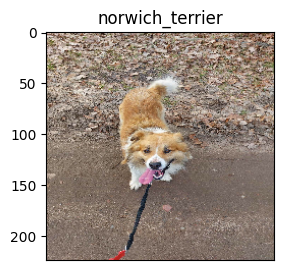

In [76]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)